### Import Libraries

In [182]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV,cross_val_score

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression

from sklearn.linear_model import Lasso,Ridge

from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from sklearn.tree import DecisionTreeRegressor, plot_tree

from sklearn.ensemble import RandomForestRegressor
import statsmodels.api as sm
from scipy.stats import shapiro

import pickle
import json

In [183]:
df = pd.read_csv("Real estate.csv")
df.drop("No" ,axis = 1, inplace= True)
df

,X1_transaction_date,X2_house_age,X3_distance_to_the_nearest_MRT_station,X4_number_of_convenience_stores,X5_latitude,X6_longitude,Y_house_price_of_uni_ area
0,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1
...,...,...,...,...,...,...,...
409,2013.000,13.7,4082.01500,0,24.94155,121.50381,15.4
410,2012.667,5.6,90.45606,9,24.97433,121.54310,50.0
411,2013.250,18.8,390.96960,7,24.97923,121.53986,40.6
412,2013.000,8.1,104.81010,5,24.96674,121.54067,52.5


In [184]:
df.corr()

,X1_transaction_date,X2_house_age,X3_distance_to_the_nearest_MRT_station,X4_number_of_convenience_stores,X5_latitude,X6_longitude,Y_house_price_of_uni_ area
X1_transaction_date,1.000000,0.017549,0.060880,0.009635,0.035058,-0.041082,0.087491
X2_house_age,0.017549,1.000000,0.025622,0.049593,0.054420,-0.048520,-0.210567
X3_distance_to_the_nearest_MRT_station,0.060880,0.025622,1.000000,-0.602519,-0.591067,-0.806317,-0.673613
X4_number_of_convenience_stores,0.009635,0.049593,-0.602519,1.000000,0.444143,0.449099,0.571005
X5_latitude,0.035058,0.054420,-0.591067,0.444143,1.000000,0.412924,0.546307
X6_longitude,-0.041082,-0.048520,-0.806317,0.449099,0.412924,1.000000,0.523287
Y_house_price_of_uni_ area,0.087491,-0.210567,-0.673613,0.571005,0.546307,0.523287,1.000000


<AxesSubplot: >

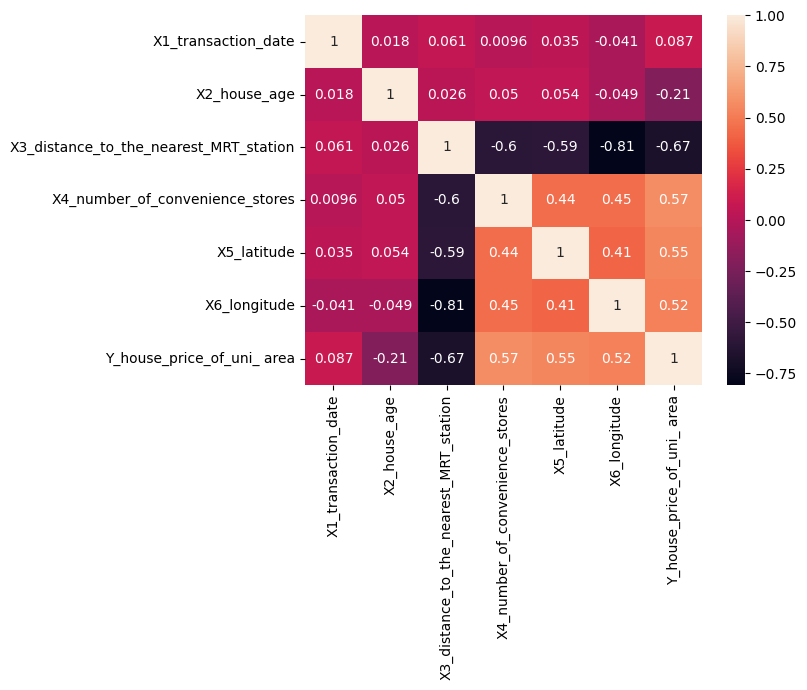

In [185]:
sns.heatmap(df.corr(),annot = True)

<AxesSubplot: xlabel='X1_transaction_date', ylabel='Density'>

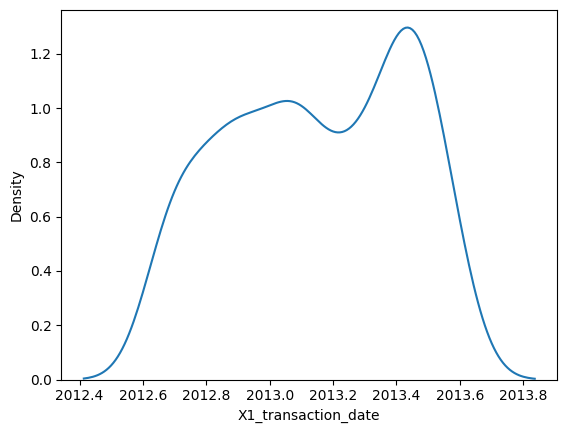

In [187]:
sns.kdeplot(df["X1_transaction_date"])

<AxesSubplot: xlabel='X2 house age', ylabel='Density'>

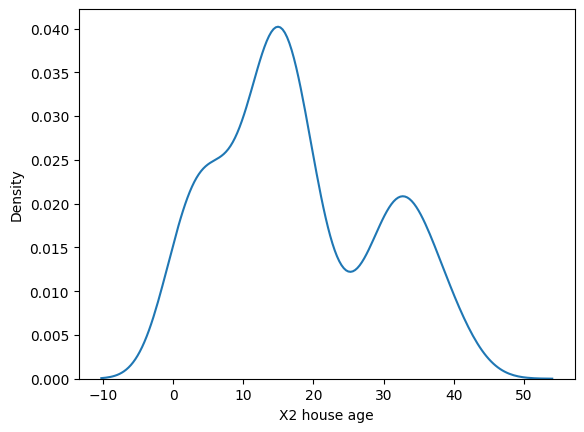

In [6]:
sns.kdeplot(df["X2 house age"])

<AxesSubplot: xlabel='X3_distance_to_the_nearest_MRT_station', ylabel='Density'>

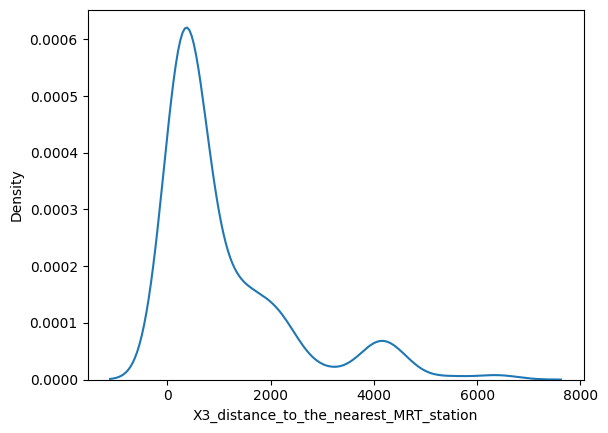

In [188]:
sns.kdeplot(df["X3_distance_to_the_nearest_MRT_station"])

<AxesSubplot: xlabel='X4_number_of_convenience_stores', ylabel='Density'>

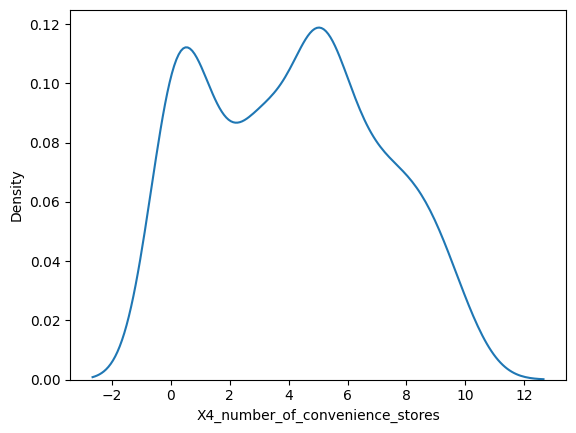

In [189]:
sns.kdeplot(df["X4_number_of_convenience_stores"])

<AxesSubplot: xlabel='X5 latitude', ylabel='Density'>

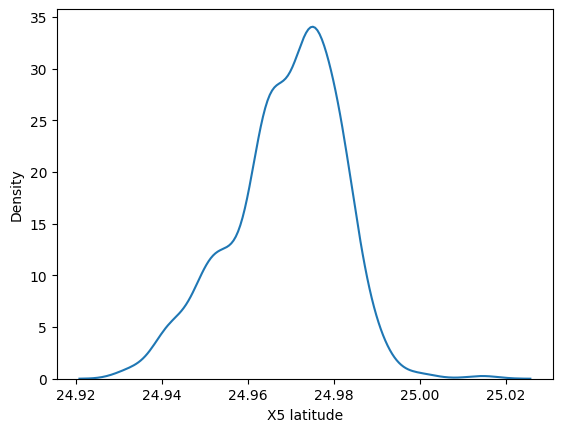

In [9]:
sns.kdeplot(df["X5_latitude"])

<AxesSubplot: xlabel='X6_longitude', ylabel='Density'>

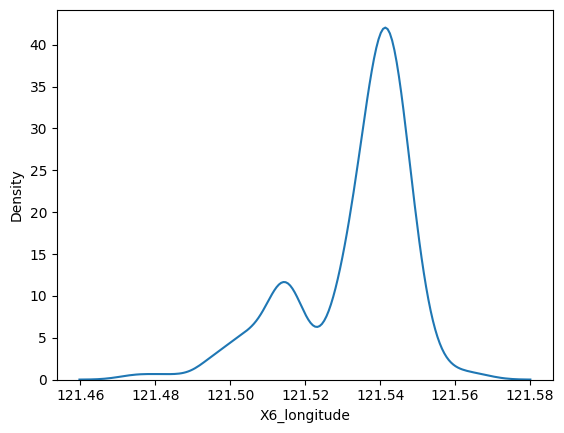

In [191]:
sns.kdeplot(df["X6_longitude"])

In [194]:
x = df.drop("Y_house_price_of_uni_ area", axis= 1)
y = df["Y_house_price_of_uni_ area"]

x_train,x_test,y_train,y_test = train_test_split(x,y,random_state= 11,test_size= 0.3,shuffle=True)


In [195]:
x_train

,X1_transaction_date,X2_house_age,X3_distance_to_the_nearest_MRT_station,X4_number_of_convenience_stores,X5_latitude,X6_longitude
356,2012.833,10.3,211.4473,1,24.97417,121.52999
155,2013.167,13.8,4082.0150,0,24.94155,121.50381
324,2012.667,12.4,1712.6320,2,24.96412,121.51670
373,2013.083,0.0,274.0144,1,24.97480,121.53059
207,2013.083,38.5,665.0636,3,24.97503,121.53692
...,...,...,...,...,...,...
337,2012.833,31.3,600.8604,5,24.96871,121.54651
91,2013.250,9.1,1402.0160,0,24.98569,121.52760
80,2013.500,11.8,533.4762,4,24.97445,121.54765
191,2013.167,13.2,750.0704,2,24.97371,121.54951


In [196]:
linear_reg = LinearRegression()
linear_reg.fit(x_train,y_train)

LinearRegression()

In [197]:
linear_reg.intercept_

-17289.653221181376

In [198]:
linear_reg.coef_

array([ 4.34842300e+00, -2.43944597e-01, -3.99566613e-03,  1.09835057e+00,
        1.87708348e+02,  3.20135183e+01])

In [199]:
train_score = linear_reg.score(x_train, y_train)
train_score

0.6306463799061612

In [200]:
test_score = linear_reg.score(x_test, y_test)
test_score

0.5040486618211508

In [201]:
#Training data evaluation
y_pred_train = linear_reg.predict(x_train)


MSE = mean_squared_error(y_train , y_pred_train)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_train , y_pred_train)
print("MAE :",mae)

r_squared = r2_score(y_train , y_pred_train)
print("R-Squared Value is :",r_squared)

n = x_train.shape[0]
k = x_train.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 57.63072741647028
RMSE : 7.591490460803483
MAE : 5.7646506474341415
R-Squared Value is : 0.6306463799061612
Adjusted R-squared value : 0.6227877922445901


In [202]:
# Testing data evaluation
y_pred = linear_reg.predict(x_test)

MSE = mean_squared_error(y_test , y_pred)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_test , y_pred)
print("MAE :",mae)

r_squared = r2_score(y_test , y_pred)
print("R-Squared Value is :",r_squared)

n = x_test.shape[0]
k = x_test.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 124.43096714472732
RMSE : 11.154862937065937
MAE : 7.09820898477342
R-Squared Value is : 0.5040486618211508
Adjusted R-squared value : 0.47883079716798893


### Lasso

In [203]:
lasso_reg = Lasso(alpha=0.1)
lasso_reg.fit(x_train,y_train)

y_pred_train = lasso_reg.predict(x_train)


MSE = mean_squared_error(y_train , y_pred_train)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_train , y_pred_train)
print("MAE :",mae)

r_squared = r2_score(y_train , y_pred_train)
print("R-Squared Value is :",r_squared)

n = x_train.shape[0]
k = x_train.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 61.163133184025156
RMSE : 7.820686234853381
MAE : 5.955925488827668
R-Squared Value is : 0.6080072962718659
Adjusted R-squared value : 0.599667025979778


In [204]:
# Testing Data Evaluation
y_pred = lasso_reg.predict(x_test)

MSE = mean_squared_error(y_test , y_pred)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_test , y_pred)
print("MAE :",mae)

r_squared = r2_score(y_test , y_pred)
print("R-Squared Value is :",r_squared)

n = x_test.shape[0]
k = x_test.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 132.57761573114269
RMSE : 11.514235351561243
MAE : 7.436228213252735
R-Squared Value is : 0.4715781172226655
Adjusted R-squared value : 0.4447092079289027


### Ridge Regression

In [205]:
# Training Data Evaluation
ridge_model = Ridge(alpha=1)
ridge_model.fit(x_train, y_train)

y_pred_train = ridge_model.predict(x_train)

MSE = mean_squared_error(y_train , y_pred_train)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_train , y_pred_train)
print("MAE :",mae)

r_squared = r2_score(y_train , y_pred_train)
print("R-Squared Value is :",r_squared)

n = x_train.shape[0]
k = x_train.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 60.85198287530267
RMSE : 7.800768095213616
MAE : 5.959039760901376
R-Squared Value is : 0.6100014493577615
Adjusted R-squared value : 0.6017036078547351


In [206]:
y_pred = ridge_model.predict(x_test)

MSE = mean_squared_error(y_test , y_pred)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_test , y_pred)
print("MAE :",mae)

r_squared = r2_score(y_test , y_pred)
print("R-Squared Value is :",r_squared)

n = x_test.shape[0]
k = x_test.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 131.7445124660245
RMSE : 11.478001240025394
MAE : 7.409706496062506
R-Squared Value is : 0.4748986626516499
Adjusted R-squared value : 0.4481985946508863


### Hyperparameter Tuning

1. gridsearchcv
2. Randomizedsearchcv

### Lasso regression

In [207]:
lasso_reg_model = Lasso(alpha = 1)
param_grid = {"alpha" : np.arange(0.05,2,0.001)}

gscv_lasso_model = GridSearchCV(lasso_reg_model,param_grid,cv = 5)
gscv_lasso_model.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=Lasso(alpha=1),
             param_grid={'alpha': array([0.05 , 0.051, 0.052, ..., 1.997, 1.998, 1.999])})

In [208]:
gscv_lasso_model.best_estimator_

Lasso(alpha=0.05)

In [209]:
gscv_lasso_model.best_params_

{'alpha': 0.05}

In [210]:
# Testing Data Evaluation
# lasso_model = Lasso(alpha=0.05)
lasso_model = gscv_lasso_model.best_estimator_

lasso_model.fit(x_train, y_train)

y_pred = lasso_model.predict(x_test)

MSE = mean_squared_error(y_test , y_pred)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_test , y_pred)
print("MAE :",mae)

r_squared = r2_score(y_test , y_pred)
print("R-Squared Value is :",r_squared)

n = x_test.shape[0]
k = x_test.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 132.24071278184857
RMSE : 11.499596200817164
MAE : 7.426875976029411
R-Squared Value is : 0.4729209298068069
Adjusted R-squared value : 0.4461202991190174


In [211]:
# Training Data Evaluation
# lasso_model = Lasso(alpha=0.077)
lasso_model = gscv_lasso_model.best_estimator_

lasso_model.fit(x_train, y_train)

y_pred_train = lasso_model.predict(x_train)

MSE = mean_squared_error(y_train , y_pred_train)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_train , y_pred_train)
print("MAE :",mae)

r_squared = r2_score(y_train , y_pred_train)
print("R-Squared Value is :",r_squared)

n = x_train.shape[0]
k = x_train.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 61.06270591512432
RMSE : 7.814262979649732
MAE : 5.963639115432689
R-Squared Value is : 0.6086509316550635
Adjusted R-squared value : 0.6003243557328307


### 2. Ridge Regresion

In [212]:
ridge_reg = Ridge(alpha=1.0)

hyp = {'alpha' : np.arange(0.05, 2, 0.001) }

rscv_ridge_reg = RandomizedSearchCV(ridge_reg, hyp, cv = 5, random_state = 23) # 3 to 10
rscv_ridge_reg.fit(x_train, y_train)
rscv_ridge_reg.best_estimator_

Ridge(alpha=0.08100000000000003)

In [213]:
# Testing Data Evaluation
# ridge_model = Ridge(alpha=0.08100)
ridge_model = rscv_ridge_reg.best_estimator_

ridge_model.fit(x_train, y_train)

y_pred = ridge_model.predict(x_test)

MSE = mean_squared_error(y_test , y_pred)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_test , y_pred)
print("MAE :",mae)

r_squared = r2_score(y_test , y_pred)
print("R-Squared Value is :",r_squared)

n = x_test.shape[0]
k = x_test.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 129.289374404556
RMSE : 11.370548553370503
MAE : 7.309544090965446
R-Squared Value is : 0.4846842412334099
Adjusted R-squared value : 0.4584817450249392


In [214]:
# Training Data Evaluation
# ridge_model = Ridge(alpha=1)
ridge_model = rscv_ridge_reg.best_estimator_

ridge_model.fit(x_train, y_train)

y_pred_train = ridge_model.predict(x_train)

MSE = mean_squared_error(y_train , y_pred_train)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_train, y_pred_train)
print("MAE :",mae)

r_squared = r2_score(y_train, y_pred_train)
print("R-Squared Value is :",r_squared)

n = x_train.shape[0]
k = x_train.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 59.52496682922033
RMSE : 7.715242499702802
MAE : 5.879260366775281
R-Squared Value is : 0.6185062557781477
Adjusted R-squared value : 0.6103893676032146


### cross val score

In [215]:
linear_regression_model = LinearRegression()
cross_val_score(linear_regression_model, x_train, y_train,cv = 5)

array([0.65451673, 0.57811184, 0.59623906, 0.51028235, 0.73414425])

In [216]:
linear_regression_model = LinearRegression()
cross_val_score(linear_regression_model, x_train, y_train,cv = 5).mean()

0.6146588464740768

### knn_regression

In [217]:
normal_scaler = MinMaxScaler() # Xmin and Xmax
normal_scaler.fit(x)
array1 = normal_scaler.transform(x)
normal_dfx = pd.DataFrame(array1, columns=x.columns)
normal_dfx

,X1_transaction_date,X2_house_age,X3_distance_to_the_nearest_MRT_station,X4_number_of_convenience_stores,X5_latitude,X6_longitude
0,0.272926,0.730594,0.009513,1.0,0.616941,0.719323
1,0.272926,0.445205,0.043809,0.9,0.584949,0.711451
2,1.000000,0.303653,0.083315,0.5,0.671231,0.758896
3,0.909389,0.303653,0.083315,0.5,0.671231,0.758896
4,0.181223,0.114155,0.056799,0.5,0.573194,0.743153
...,...,...,...,...,...,...
409,0.363537,0.312785,0.627820,0.0,0.114881,0.326504
410,0.000000,0.127854,0.010375,0.9,0.512118,0.750162
411,0.636463,0.429224,0.056861,0.7,0.571498,0.715225
412,0.363537,0.184932,0.012596,0.5,0.420141,0.723959


In [218]:
x_train_N,x_test_N,y_train_N,y_test_N = train_test_split(normal_dfx,y,test_size=0.3 , random_state=20)

In [219]:
knn_reg = KNeighborsRegressor(n_neighbors= 6, p = 1)
knn_reg.fit(x_train_N,y_train_N)

KNeighborsRegressor(n_neighbors=6, p=1)

In [220]:
y_pred_train = knn_reg.predict(x_train_N)

MSE = mean_squared_error(y_train_N , y_pred_train)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_train_N, y_pred_train)
print("MAE :",mae)

r_squared = r2_score(y_train_N, y_pred_train)
print("R-Squared Value is :",r_squared)

n = x_train_N.shape[0]
k = x_train_N.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 60.07230872741253
RMSE : 7.750632795289204
MAE : 4.9988465974625145
R-Squared Value is : 0.6897884337146425
Adjusted R-squared value : 0.6831881876234647


In [221]:
y_pred = knn_reg.predict(x_test_N)

MSE = mean_squared_error(y_test_N, y_pred)
print("MSE :",MSE)

RMSE = np.sqrt(MSE)
print("RMSE :",RMSE)

mae = mean_absolute_error(y_test_N, y_pred)
print("MAE :",mae)

r_squared = r2_score(y_test_N, y_pred)
print("R-Squared Value is :",r_squared)

n = x_test_N.shape[0]
k = x_test_N.shape[1]

adj_r2 = 1 - (((1- r_squared) * (n - 1))/(n - k - 1))
print("Adjusted R-squared value :",adj_r2)

MSE : 42.943548888888884
RMSE : 6.55313275379714
MAE : 5.0313333333333325
R-Squared Value is : 0.7361769455716041
Adjusted R-squared value : 0.7227622139904992


### Residual

In [222]:
residual = y_train_N - y_pred_train # Yactual - Ypred
residual

8       0.050000
20     -0.683333
24     -1.750000
301     6.233333
32      0.400000
         ...    
393    -0.983333
218     8.666667
223   -11.533333
271   -15.000000
355     7.716667
Name: Y_house_price_of_uni_ area, Length: 289, dtype: float64

<AxesSubplot: xlabel='Y_house_price_of_uni_ area', ylabel='Density'>

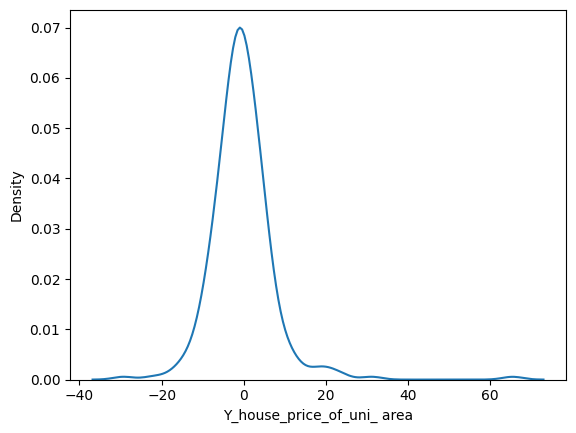

In [223]:
sns.kdeplot(residual)

<AxesSubplot: xlabel='Y_house_price_of_uni_ area', ylabel='Count'>

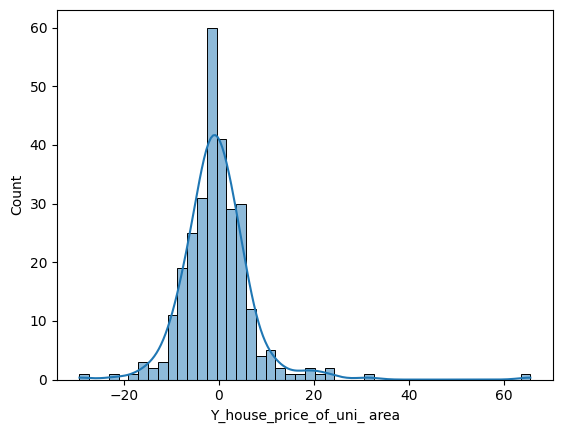

In [224]:
sns.histplot(residual, kde=True)

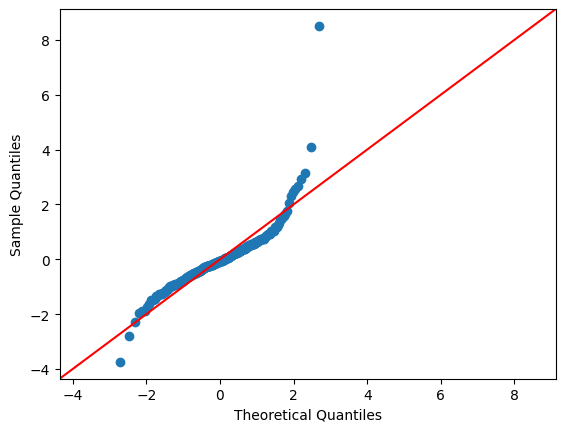

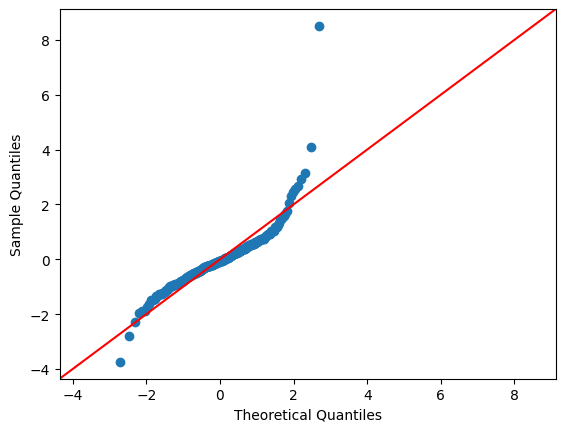

In [225]:
sm.qqplot(residual, line='45', fit = True)

#### Shapiro

In [226]:
stats , p_val = shapiro(residual)
_ , p_val = shapiro(residual)

if p_val >= 0.05:
    print("Data is normally distibuted")
    print("NULL Hypothesis is TRUE")

else:
    print("Data is not normally distibuted")
    print("Alternate Hypothesis is TRUE")

Data is not normally distibuted
Alternate Hypothesis is TRUE


### Decision Tree For Regression

In [227]:
# Model Training

dt_model = DecisionTreeRegressor(random_state= 15)
dt_model.fit(x_train,y_train)

DecisionTreeRegressor(random_state=15)

### Model Evaluation

In [228]:
# Training Data Evaluation
y_pred_train = dt_model.predict(x_train)
mse = mean_squared_error(y_train, y_pred_train)
print("Mean Squared Error :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

mae = mean_absolute_error(y_train, y_pred_train)
print('Mean Absolute Error :',mae)

r2_value = r2_score(y_train, y_pred_train)
print("R-Squared :",r2_value)


Mean Squared Error : 0.37570934256055377
RMSE : 0.6129513378405775
Mean Absolute Error : 0.13702422145328721
R-Squared : 0.9975920899839595


In [229]:
# Testing Data Evaluation
y_pred = dt_model.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error :',mae)

r2_value = r2_score(y_test, y_pred)
print("R-Squared :",r2_value)


Mean Squared Error : 117.64531999999998
RMSE : 10.846442734832467
Mean Absolute Error : 6.182399999999999
R-Squared : 0.5310945882417237


In [230]:
plt.figure(figsize=(150,100))
tree = plot_tree(dt_model,feature_names=x.columns, filled= True)
plt.savefig("DT_model.png")

In [231]:
dt_reg = DecisionTreeRegressor(random_state= 15, max_depth= 4, max_features=None)
dt_reg.fit(x_train,y_train)
plt.figure(figsize=(200,100))
tree = plot_tree(dt_reg, feature_names= x.columns, filled= True)
plt.savefig("DT_reg_test.png")

### Hyperparameter Tuning

In [232]:
dt_reg = DecisionTreeRegressor(random_state=25, max_features=None)
hyp = {'criterion' : ["squared_error"],
      "max_depth" : np.arange(3,10),
      "min_samples_split": np.arange(5,20),
      "min_samples_leaf" : np.arange(3,10)}

gscv_dt_reg = GridSearchCV(dt_reg, hyp, cv = 6,n_jobs = -1)
gscv_dt_reg.fit(x_train, y_train)
gscv_dt_reg.best_estimator_

DecisionTreeRegressor(max_depth=4, min_samples_leaf=6, min_samples_split=16,
                      random_state=25)

In [233]:
dt_reg = DecisionTreeRegressor(random_state=12)
dt_reg = gscv_dt_reg.best_estimator_

dt_reg.fit(x_train, y_train)

DecisionTreeRegressor(max_depth=4, min_samples_leaf=6, min_samples_split=16,
                      random_state=25)

In [234]:
# Training Data Evaluation
y_pred_train = dt_reg.predict(x_train)
mse = mean_squared_error(y_train, y_pred_train)
print("Mean Squared Error :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

mae = mean_absolute_error(y_train, y_pred_train)
print('Mean Absolute Error :',mae)

r2_value = r2_score(y_train, y_pred_train)
print("R-Squared :",r2_value)

Mean Squared Error : 34.67478005423101
RMSE : 5.888529532424118
Mean Absolute Error : 4.512784218539113
R-Squared : 0.7777703646453077


In [235]:
# Testing Data Evaluation
y_pred = dt_reg.predict(x_test)

y_pred[5:10]

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error :',mae)

r2_value = r2_score(y_test, y_pred)
print("R-Squared :",r2_value)

Mean Squared Error : 113.08021027760316
RMSE : 10.633917917569383
Mean Absolute Error : 6.185075338224791
R-Squared : 0.5492899967297298


In [236]:
plt.figure(figsize=(150,100))
tree = plot_tree(dt_reg, feature_names=x.columns, filled=True)
plt.savefig('DT_Reg_Hyp.png')

### Pruning

In [237]:
dt_reg_pruning = DecisionTreeRegressor(random_state= 17)
dt_reg_pruning.fit(x_train,y_train)

DecisionTreeRegressor(random_state=17)

In [238]:
ccp_alphas = dt_reg_pruning.cost_complexity_pruning_path(x_train, y_train)['ccp_alphas']
ccp_alphas.shape

(256,)

In [239]:
train_data_accuracy = []
test_data_accuracy = []

for i in ccp_alphas:
    dt_reg_pruning = DecisionTreeRegressor(random_state=17, ccp_alpha=i)
    dt_reg_pruning.fit(x_train, y_train)
    
    r2_train = dt_reg_pruning.score(x_train, y_train)
    train_data_accuracy.append(r2_train)
    
    r2_test = dt_reg_pruning.score(x_test, y_test)
    test_data_accuracy.append(r2_test)

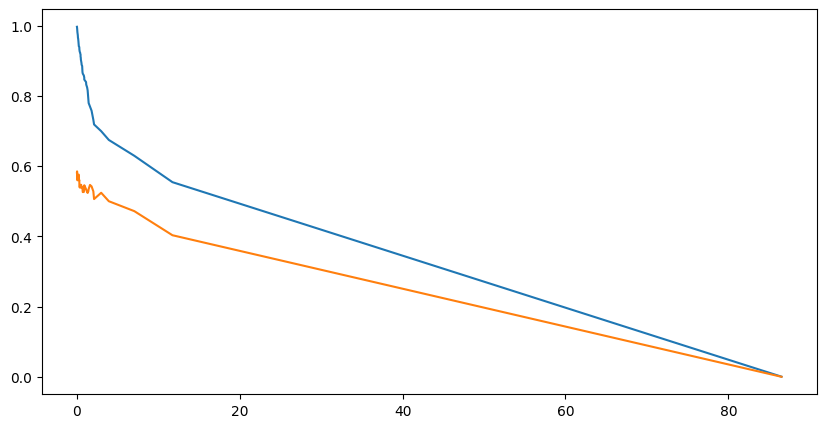

In [240]:
plt.figure(figsize=(10,5))
plt.plot(ccp_alphas, train_data_accuracy)
plt.plot(ccp_alphas, test_data_accuracy)
plt.savefig('CCP_Alpha_comparison.png')

In [241]:
index = np.argmax(test_data_accuracy)

In [242]:
train_data_accuracy[index]

0.9952840185037766

In [243]:
test_data_accuracy[index]

0.5846049293901625

In [244]:
ccp_alphas[index]

0.012560553633214438

In [245]:
dt_reg_pruning = DecisionTreeRegressor(random_state=17, ccp_alpha=ccp_alphas[index])
dt_reg_pruning.fit(x_train, y_train)

plt.figure(figsize=(150,100))
tree = plot_tree(dt_reg_pruning, feature_names=x.columns, filled=True)
plt.savefig('DT_Reg_pruning.png')

<AxesSubplot: >

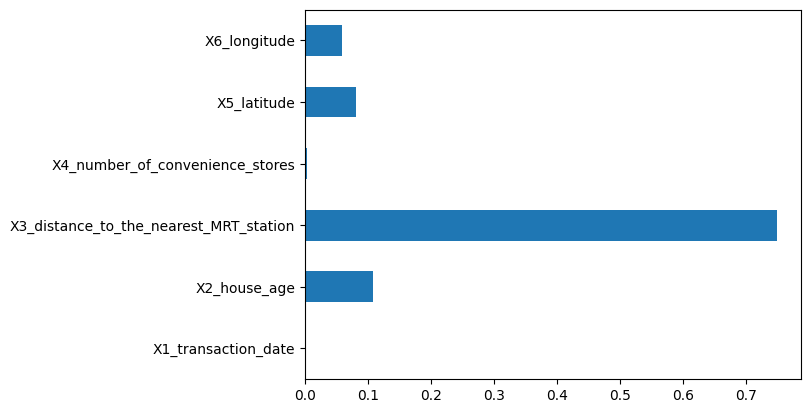

In [246]:
s1 = pd.Series(dt_reg.feature_importances_, index = x.columns)
s1.plot(kind = 'barh')

### Ramdom Forest

In [247]:
rf_reg = RandomForestRegressor(random_state= 15)
rf_reg.fit(x_train,y_train)

RandomForestRegressor(random_state=15)

In [248]:
# Training Data Evaluation
y_pred_train = rf_reg.predict(x_train)
mse = mean_squared_error(y_train, y_pred_train)
print("Mean Squared Error :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

mae = mean_absolute_error(y_train, y_pred_train)
print('Mean Absolute Error :',mae)

r2_value = r2_score(y_train, y_pred_train)
print("R-Squared :",r2_value)

Mean Squared Error : 5.886895630527661
RMSE : 2.4262925690294774
Mean Absolute Error : 1.7939805239742943
R-Squared : 0.9622710607739338


In [249]:
# Testing Data Evaluation
y_pred = rf_reg.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error :',mae)

r2_value = r2_score(y_test, y_pred)
print("R-Squared :",r2_value)

Mean Squared Error : 92.30151755202441
RMSE : 9.607367878457888
Mean Absolute Error : 4.9210747999999995
R-Squared : 0.6321087732716798


### Hyperparameter Tuning

In [250]:
rf_reg = RandomForestRegressor(random_state=17, 
                               max_features='auto',
                               oob_score=False,
                               bootstrap=True,
                               n_jobs=-1)

hyperparameters = { "n_estimators" : np.arange(10,150,10),
                    "criterion" : ["squared_error"],
                    "max_depth" : np.arange(3,8),
                    "min_samples_split" : np.arange(4,20),
                    "min_samples_leaf" : np.arange(3,10)}

# gscv_rf_clf = GridSearchCV(rf_clf, hyperparameters, cv = 5)
rscv_rf_reg = RandomizedSearchCV(rf_clf, hyperparameters, cv = 5)

rscv_rf_reg.fit(x_train, y_train)
rscv_rf_reg.best_estimator_

D:\Program Installation\lib\site-packages\sklearn\ensemble\_forest.py:414: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
D:\Program Installation\lib\site-packages\sklearn\ensemble\_forest.py:414: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
D:\Program Installation\lib\site-packages\sklearn\ensemble\_forest.py:414: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegr

D:\Program Installation\lib\site-packages\sklearn\ensemble\_forest.py:414: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
D:\Program Installation\lib\site-packages\sklearn\ensemble\_forest.py:414: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
D:\Program Installation\lib\site-packages\sklearn\ensemble\_forest.py:414: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegr

D:\Program Installation\lib\site-packages\sklearn\ensemble\_forest.py:414: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


RandomForestRegressor(max_depth=7, max_features='auto', min_samples_leaf=5,
                      min_samples_split=5, n_estimators=40, n_jobs=-1,
                      random_state=15)

### evaluation after hyperparameter tuning 

In [251]:
rf_reg = RandomForestRegressor(random_state=17)
rf_reg = rscv_rf_reg.best_estimator_

rf_reg = RandomForestRegressor(max_depth=7, max_features='auto', min_samples_leaf=3,
                      min_samples_split=8, n_estimators=30, n_jobs=-1,
                      random_state=15)

rf_reg.fit(x_train,y_train)

D:\Program Installation\lib\site-packages\sklearn\ensemble\_forest.py:414: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


RandomForestRegressor(max_depth=7, max_features='auto', min_samples_leaf=3,
                      min_samples_split=8, n_estimators=30, n_jobs=-1,
                      random_state=15)

In [252]:
# Training Data Evaluation
y_pred_train = rf_reg.predict(x_train)
mse = mean_squared_error(y_train, y_pred_train)
print("Mean Squared Error :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

mae = mean_absolute_error(y_train, y_pred_train)
print('Mean Absolute Error :',mae)

r2_value = r2_score(y_train, y_pred_train)
print("R-Squared :",r2_value)

Mean Squared Error : 18.651757833909627
RMSE : 4.318768092165824
Mean Absolute Error : 3.1018432563831975
R-Squared : 0.8804614380921504


In [253]:
# Testing Data Evaluation
y_pred = rf_reg.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error :',mae)

r2_value = r2_score(y_test, y_pred)
print("R-Squared :",r2_value)

Mean Squared Error : 96.42173536087243
RMSE : 9.819456978920599
Mean Absolute Error : 5.222343100161699
R-Squared : 0.6156865949122545


In [254]:
rf_clf.feature_importances_

array([0.03349264, 0.14655805, 0.64687962, 0.01725479, 0.09294185,
       0.06287305])

<AxesSubplot: >

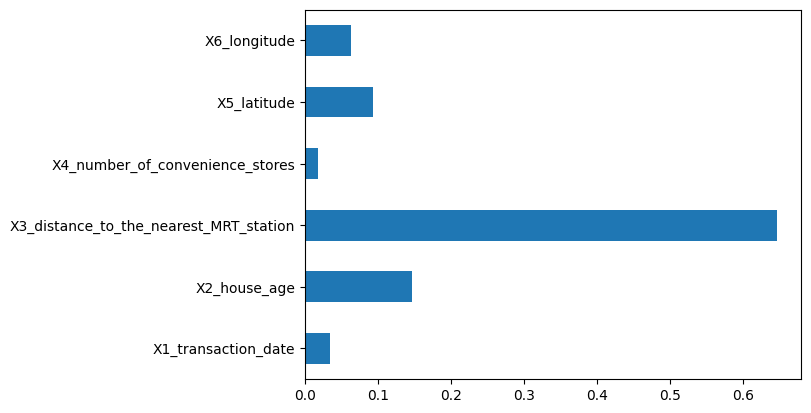

In [255]:
s1 = pd.Series(rf_clf.feature_importances_, index=x.columns)
s1.plot(kind = 'barh')

### Save Model

In [258]:
with open(r"artifacts/knn_regression.pkl", "wb") as f:
    pickle.dump(knn_reg,f)
    
with open(r"artifacts/minmaxscaler.pkl","wb") as f:
    pickle.dump(normal_scaler,f)

### Column

In [257]:
column_names = x.columns
project_data = {"Column Names" : column_names.to_list()}

with open(r"artifacts/project_data.json","w") as f:
    json.dump(project_data,f)

In [256]:
x.columns


Index(['X1_transaction_date', 'X2_house_age',
       'X3_distance_to_the_nearest_MRT_station',
       'X4_number_of_convenience_stores', 'X5_latitude', 'X6_longitude'],
      dtype='object')